<a href="https://colab.research.google.com/github/maxvell07/TelecomLabs/blob/main/Lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Упражнение 1.1**
Посмотреть с помощью chap01.ipynb примеры и пояснения.

# **Упражнение 1.2**
Скачайте с сайта https://freesound.org/ образец звука, включающий музыку, речь или иные звуки, имеющие четко выраженную высоту. Выделите примерно полусекундный сегмент, в котором высота постоянна. Вычислите и распечатайте спектр выбранного сегмента. Как связанны тембр звука и гармоническая структура, видимая в спепктре?

Используйте high_pass, low_pass и band_stop для фильтрации тех или иных гармоник. Затем преобразуйте спектры обратно в сигнал и прослушайте его. Как звук соотносится с изменениями, сделанными в спектре?

Ипморт библиотек и файлов:

In [ ]:
import os
if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

if not os.path.exists('92002__jcveliz__violin-origional.wav'):
    !wget https://github.com/maxvell07/TelecomLabs/raw/main/725570__alomsound__80s-glassy-e-piano-e.wav

--2024-03-04 13:25:50--  https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/AllenDowney/ThinkDSP/master/code/thinkdsp.py [following]
--2024-03-04 13:25:50--  https://raw.githubusercontent.com/AllenDowney/ThinkDSP/master/code/thinkdsp.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48574 (47K) [text/plain]
Saving to: ‘thinkdsp.py’

thinkdsp.py         100%[===================>]  47.44K  --.-KB/s    in 0.007s  

2024-03-04 13:25:51 (6.19 MB/s) - ‘thinkdsp.py’ saved [48574/48574]

--2024-03-04 13:25:51--  https://github.com/maxvell

Создадим объект `wave` из скачанного звука, создадим сам звук для прослушивания:

In [ ]:
from thinkdsp import read_wave

wave = read_wave('725570__alomsound__80s-glassy-e-piano-e.wav')
wave.normalize()
wave.make_audio()

Построим график сегмента нашего звука:

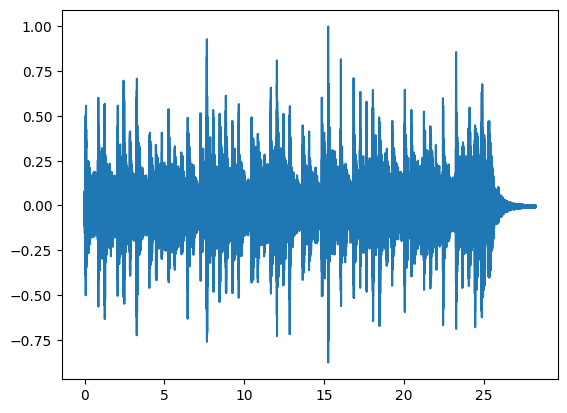

In [ ]:
wave.plot()

Выделим полусекундный сегмент, где высота постоянна и послушаем его:

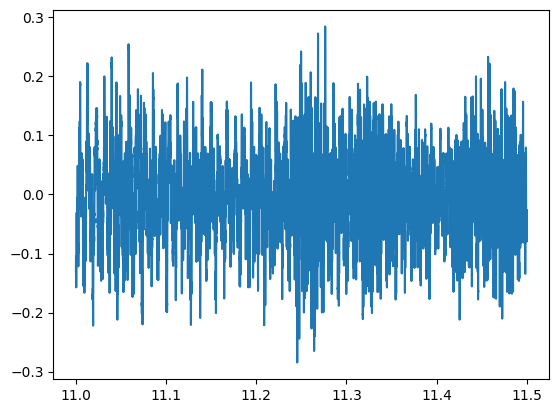

In [ ]:
segment = wave.segment(11.0,0.5)
segment.plot()
segment.make_audio()

Вычислим и выведем спектр выделенного сегмента:

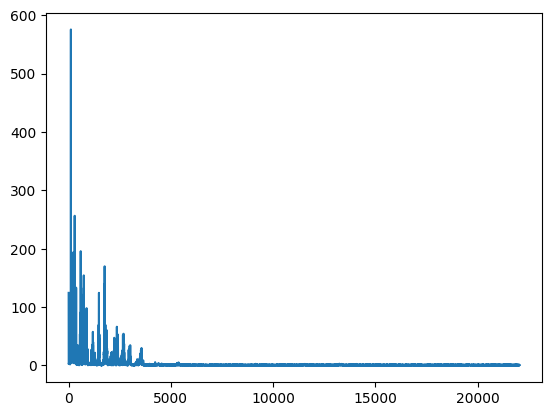

In [ ]:
spectrum = segment.make_spectrum()
spectrum.plot()

Исходя из спектра, можно сделать вывод, что звук локализован примерно в первых 4 кГц. Выведем спектр этого диапазона:

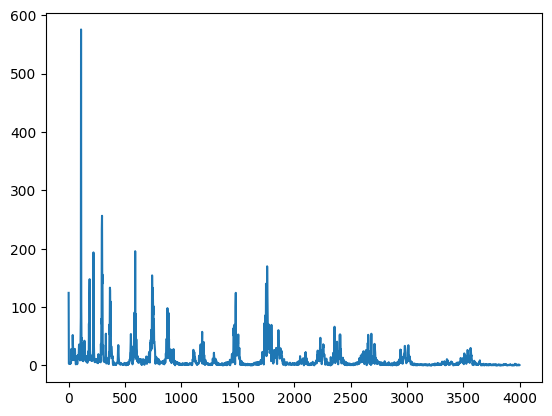

In [ ]:
spectrum.plot(high = 4000)

Приблизим диаграмму до 2 кГц:

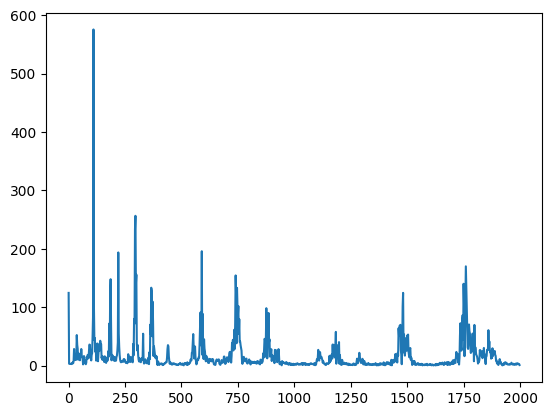

In [ ]:
spectrum.plot(2000)

Выделим доминирующую частоту:

In [ ]:
spectrum.peaks()[:5]

[(575.5750649569968, 110.0),
 (256.42441816233867, 296.0),
 (233.6140640408036, 294.0),
 (195.7584887029617, 590.0),
 (193.67680434377186, 220.0)]

Видно, что доминирующая частота - 110 Гц (первая в списке).

Воспользуемся `low_pass`, тем самым отфильтруем всё, что выше 2 кГц:

In [ ]:
spectrum.low_pass(2000)
filtered = spectrum.make_wave()

Сравним исходный звук (первый) и получившийся отфильтрованный (второй):

In [ ]:
segment.make_audio()

In [ ]:
filtered.make_audio()

Видно, что звук стал более глухим. Это следствие того, что с обрезанием частот изменилась форма сигнала и его тембр.

Теперь воспользуемся `high_pass` и `band_stop` для исходного выделенного сегмента. Посмотрим на получившуюся диаграмму и послушаем, какой звук получился после одновременной фильтрации с помощью фильтра высоких частот (первый метод) и полосно-заграждающего фильтра (второй метод).

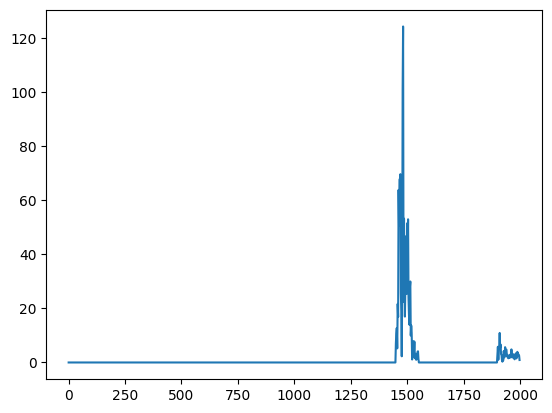

In [ ]:
edited = segment.make_spectrum()
edited.high_pass(1450)
edited.band_stop(1550,1900)
edited.plot(2000)
edited.make_wave().make_audio()

Слышно (и видно), что звук стал немного более звонким и "тонким", гитара стала чуть более электронной, нежели настоящая. Это логично, так как мы срезали большую часть частот, кроме основной, тем самым лишив звука того самого "объёма".

# **Упражнение 1.3**
Создайте сложный сигнал из объектов SinSignal и CosSignal, суммируя их. Обработайте сигнал для получения wave и прослушайте его. Вычислите Spectrum и распечатайте. Что произойдет при добавлении частот, не кратных основным?

Соберём, например, (до-ре-соль-до), но будем использовать как косинус, так и синус. Послушаем и посмотрим, что получилось:

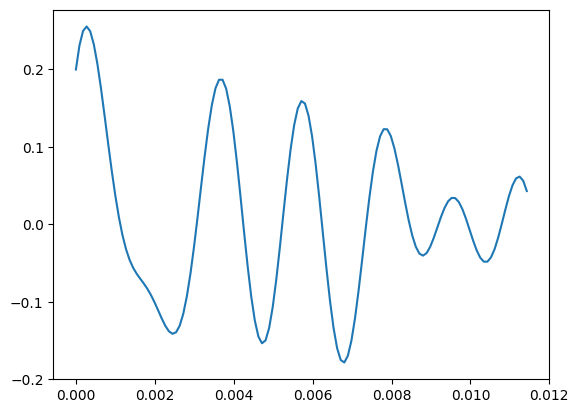

In [ ]:
from thinkdsp import SinSignal, CosSignal

sin_DO = SinSignal(freq=261 , amp=0.1)
cos_RE = CosSignal(freq=293, amp=0.1)
sin_SOL = SinSignal(freq=392, amp=0.1)
cos_DO = CosSignal(freq=523.25, amp=0.1)

my_signal = sin_DO + cos_RE + sin_SOL + cos_DO
my_signal_wave = my_signal.make_wave(duration=1)
my_signal.plot()
my_signal_wave.make_audio()

Вычислим и распечатаем *Spectrum*:

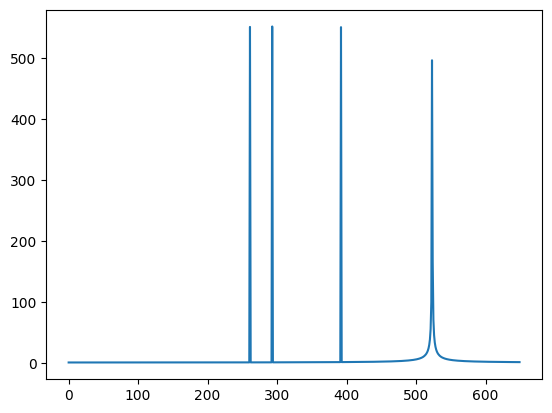

In [ ]:
spectrum = my_signal_wave.make_spectrum()
spectrum.plot(high = 650)

Попробуем добавить ноту, не входящую в него, которую можно считать некратной остальным частотам. Посмотрим и послушаем, что получилось:

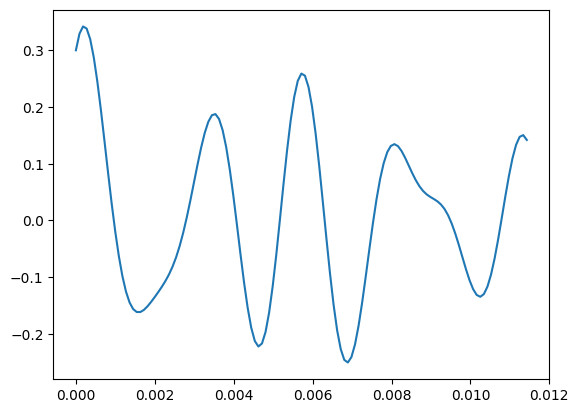

In [ ]:
cos_FA = CosSignal(freq=348, amp=0.1)
newSignal = my_signal + cos_FA
newSignal_wave = newSignal.make_wave(duration=1)
newSignal.plot()
newSignal_wave.make_audio()

Так как мы добавили пониженную ступень в тональности до-мажор.

Посмотрим его *Spectrum*:

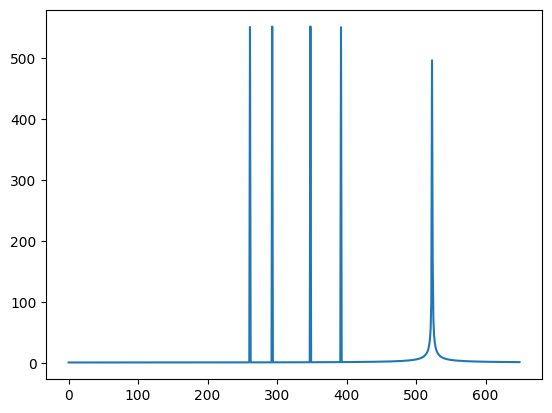

In [ ]:
spectrum = newSignal_wave.make_spectrum()
spectrum.plot(high = 650)

# **Упражнение 1.4**
Напишите функцию `stretch`, берущую wave и коэффициент изменения. Она должна ускорять или замедлять сигнал изменением `ts` и `framerate`. Подсказка: должно получиться всего 2 строки кода.

Ниже представлена получившаяся функция:

In [ ]:
def stretch(wave, factor):
  wave.ts *= factor
  wave.framerate /= factor

Проверим её на нашем первоначальном звуке. Для начала выведем сам звук и его спектрограмму:

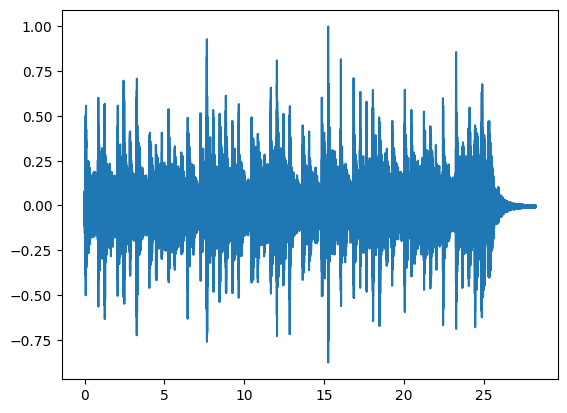

In [ ]:
wave = read_wave('725570__alomsound__80s-glassy-e-piano-e.wav')
wave.plot()
wave.make_audio()

Теперь ускорим наш звук в 2 раза:

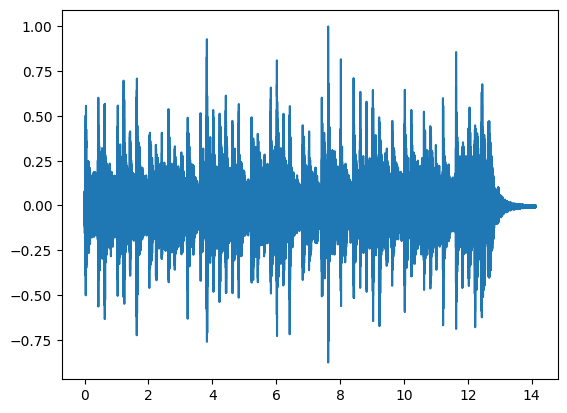

In [ ]:
stretch(wave, 0.5)
wave.plot()
wave.make_audio()

Теперь наоборот, замедлим в 2 раза:

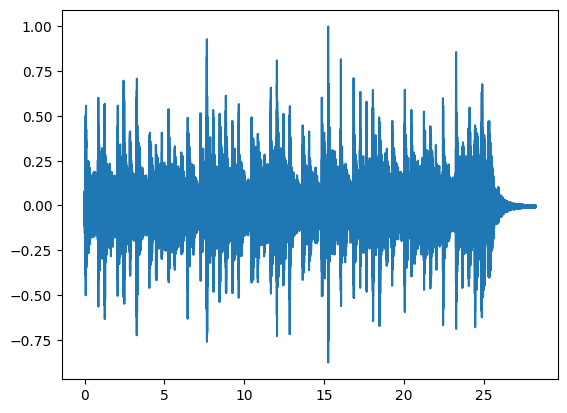

In [ ]:
stretch(wave, 2)
wave.plot()
wave.make_audio()